<a href="https://colab.research.google.com/github/NID123-CH/LLM-Codes/blob/main/Copy_of_scratchpad_images_of_neukolln_openclip_small_vit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install open-clip-torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
from pathlib import Path
import os

path = Path('/gdrive/MyDrive/images_of_neukoelln/NK')
len(os.listdir(path))

627

In [ ]:
import torch
import open_clip
import numpy as np
from PIL import Image
from pathlib import Path
from typing import Union, List, Optional, Tuple, Dict
from dataclasses import dataclass
import logging
from tqdm.auto import tqdm

@dataclass
class EmbeddingResult:
    """Container for embedding results with metadata"""
    embedding: np.ndarray
    metadata: dict

class VITB32Embedder:
    def __init__(
        self,
        device: Optional[str] = None,
        batch_size: int = 16,  # Reduced default batch size for CPU
        cache_dir: Optional[str] = None
    ):
        """
        Initialize the ViT-B/32 model for creating both image and text embeddings.
        This is a lighter version optimized for CPU usage.

        Args:
            device: Device to run the model on ('cuda' or 'cpu')
            batch_size: Default batch size for processing (reduced for CPU)
            cache_dir: Directory to cache embeddings (optional)
        """
        self.device = "cpu"  # Force CPU usage
        self.batch_size = batch_size
        self.cache_dir = Path(cache_dir) if cache_dir else None

        # Setup logging
        logging.basicConfig(level=logging.INFO)
        self.logger = logging.getLogger(__name__)

        # Load smaller model and processors
        self.model, _, self.preprocess = open_clip.create_model_and_transforms(
            'ViT-B-32',  # Smaller model
            pretrained='laion2b_s34b_b79k',  # Different pretrained weights
            device=self.device
        )
        self.tokenizer = open_clip.get_tokenizer('ViT-B-32')

        # Put model in evaluation mode
        self.model.eval()

        self.logger.info(f"Initialized ViT-B/32 model on CPU")

    def _normalize_embedding(self, embedding: torch.Tensor) -> torch.Tensor:
        """Normalize embedding vectors"""
        return embedding / embedding.norm(dim=-1, keepdim=True)

    @torch.no_grad()
    def create_image_embedding(
        self,
        image_path: Union[str, Path],
        return_tensor: bool = False
    ) -> Union[np.ndarray, torch.Tensor]:
        """
        Create embedding for a single image.

        Args:
            image_path: Path to image file
            return_tensor: If True, return PyTorch tensor instead of numpy array

        Returns:
            Normalized embedding vector
        """
        try:
            # Load and preprocess image
            image = Image.open(image_path).convert('RGB')
            image_input = self.preprocess(image).unsqueeze(0)  # Already on CPU

            # Generate embedding
            image_features = self.model.encode_image(image_input)
            normalized_features = self._normalize_embedding(image_features)

            return normalized_features if return_tensor else normalized_features.numpy()

        except Exception as e:
            self.logger.error(f"Error processing image {image_path}: {str(e)}")
            raise

    @torch.no_grad()
    def create_batch_image_embeddings(
        self,
        image_paths: List[Union[str, Path]],
        show_progress: bool = True
    ) -> Dict[str, EmbeddingResult]:
        """
        Create embeddings for multiple images in batches.

        Args:
            image_paths: List of paths to image files
            show_progress: Whether to show progress bar

        Returns:
            Dictionary of path: EmbeddingResult pairs
        """
        results = {}

        for i in tqdm(range(0, len(image_paths), self.batch_size),
                     disable=not show_progress):
            batch_paths = image_paths[i:i + self.batch_size]
            batch_tensors = []
            valid_paths = []

            # Prepare batch
            for path in batch_paths:
                try:
                    image = Image.open(path).convert('RGB')
                    tensor = self.preprocess(image).unsqueeze(0)
                    batch_tensors.append(tensor)
                    valid_paths.append(path)
                except Exception as e:
                    self.logger.warning(f"Skipping {path}: {str(e)}")
                    continue

            if not batch_tensors:
                continue

            # Process batch
            batch_input = torch.cat(batch_tensors)  # Already on CPU
            batch_features = self.model.encode_image(batch_input)
            batch_features = self._normalize_embedding(batch_features)

            # Store results
            for path, embedding in zip(valid_paths, batch_features.numpy()):
                results[str(path)] = EmbeddingResult(
                    embedding=embedding,
                    metadata={"type": "image", "path": str(path)}
                )

        return results

    @torch.no_grad()
    def create_text_embedding(
        self,
        text: Union[str, List[str]],
        return_tensor: bool = False
    ) -> Union[np.ndarray, torch.Tensor]:
        """
        Create embedding(s) for text input.

        Args:
            text: Single text string or list of strings
            return_tensor: If True, return PyTorch tensor instead of numpy array

        Returns:
            Normalized embedding vector(s)
        """
        # Handle single string input
        if isinstance(text, str):
            text = [text]

        # Tokenize and encode
        text_tokens = self.tokenizer(text)  # Already on CPU
        text_features = self.model.encode_text(text_tokens)
        normalized_features = self._normalize_embedding(text_features)

        return normalized_features if return_tensor else normalized_features.numpy()

    def compute_similarity(
        self,
        embedding1: Union[np.ndarray, torch.Tensor],
        embedding2: Union[np.ndarray, torch.Tensor]
    ) -> float:
        """
        Compute cosine similarity between embeddings.
        """
        if isinstance(embedding1, torch.Tensor):
            embedding1 = embedding1.numpy()
        if isinstance(embedding2, torch.Tensor):
            embedding2 = embedding2.numpy()

        return np.dot(embedding1.flatten(), embedding2.flatten())

    def find_similar_images(
        self,
        query_embedding: Union[np.ndarray, torch.Tensor],
        image_embeddings: Dict[str, EmbeddingResult],
        top_k: int = 5
    ) -> List[Tuple[str, float]]:
        """
        Find most similar images to a query embedding.

        Args:
            query_embedding: Embedding vector to compare against
            image_embeddings: Dictionary of image embeddings
            top_k: Number of results to return

        Returns:
            List of (image_path, similarity_score) tuples
        """
        if isinstance(query_embedding, torch.Tensor):
            query_embedding = query_embedding.numpy()

        similarities = [
            (path, self.compute_similarity(query_embedding, result.embedding))
            for path, result in image_embeddings.items()
        ]

        return sorted(similarities, key=lambda x: x[1], reverse=True)[:top_k]

    def batch_text_search(
        self,
        text_queries: List[str],
        image_embeddings: Dict[str, EmbeddingResult],
        top_k: int = 5
    ) -> Dict[str, List[Tuple[str, float]]]:
        """
        Perform batch text-to-image search.

        Args:
            text_queries: List of text queries
            image_embeddings: Dictionary of image embeddings
            top_k: Number of results per query

        Returns:
            Dictionary mapping queries to their top matches
        """
        # Create text embeddings for all queries
        query_embeddings = self.create_text_embedding(text_queries)

        results = {}
        for query, embedding in zip(text_queries, query_embeddings):
            results[query] = self.find_similar_images(
                embedding, image_embeddings, top_k
            )

        return results

In [ ]:
 # Initialize embedder
embedder = VITB32Embedder(cache_dir="embeddings_cache")
embedder

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

In [ ]:
image_paths = [path / filename for filename in os.listdir(path)]

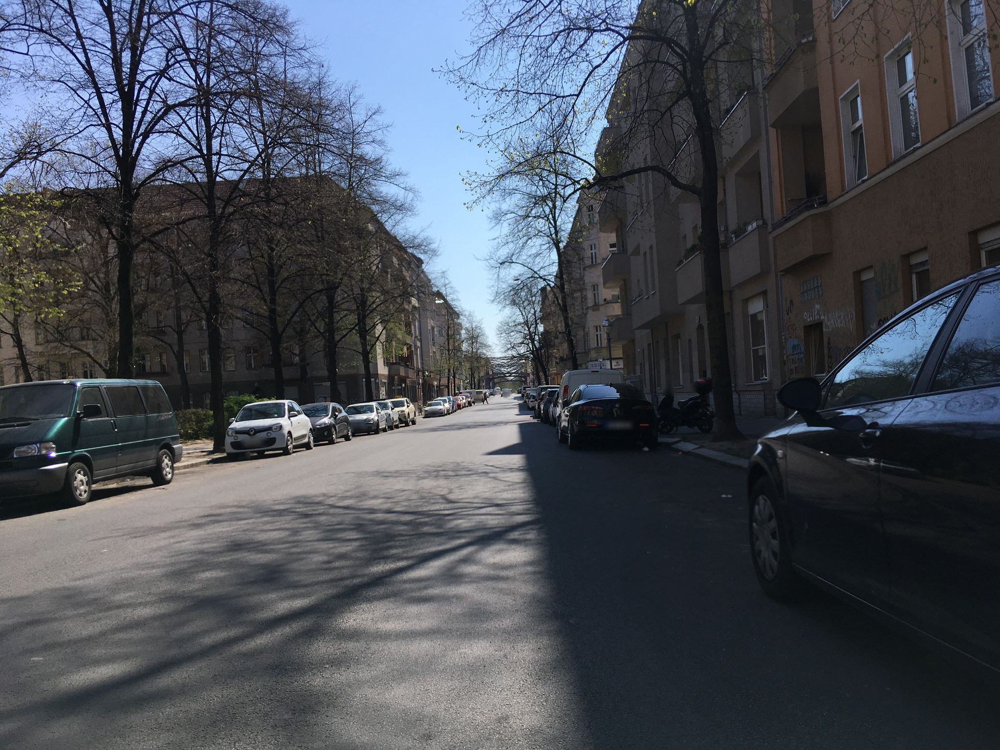

In [ ]:
Image.open(image_paths[0])

In [ ]:
batch_results = embedder.create_batch_image_embeddings(image_paths)
print(f"Processed {len(batch_results)} images")

# Example text embedding
text_query = "a road with cobblestone"
text_embedding = embedder.create_text_embedding(text_query)
print(f"Text embedding shape: {text_embedding.shape}")



  0%|          | 0/40 [00:00<?, ?it/s]

Processed 627 images
Text embedding shape: (1, 512)


In [ ]:
# Example text-to-image search
text_queries = [
   'cobblestone',
   'asphalt'

]

search_results = embedder.batch_text_search(text_queries, batch_results)
search_results

{'cobblestone': [('/gdrive/MyDrive/images_of_neukoelln/NK/409067294192977.jpg',
   0.3104951),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/430114658645960.jpg', 0.3072448),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/1133855457019372.jpg', 0.30420512),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/272813098114539.jpg', 0.30375785),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/497023818208295.jpg', 0.30332106)],
 'asphalt': [('/gdrive/MyDrive/images_of_neukoelln/NK/1138801943301388.jpg',
   0.30520493),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/252982076276127.jpg', 0.28341883),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/979764889518531.jpg', 0.26929012),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/555760999194123.jpg', 0.26599476),
  ('/gdrive/MyDrive/images_of_neukoelln/NK/3963365877093051.jpg', 0.26525515)]}

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [ ]:
search_results.keys()

dict_keys(['cobblestone', 'asphalt'])

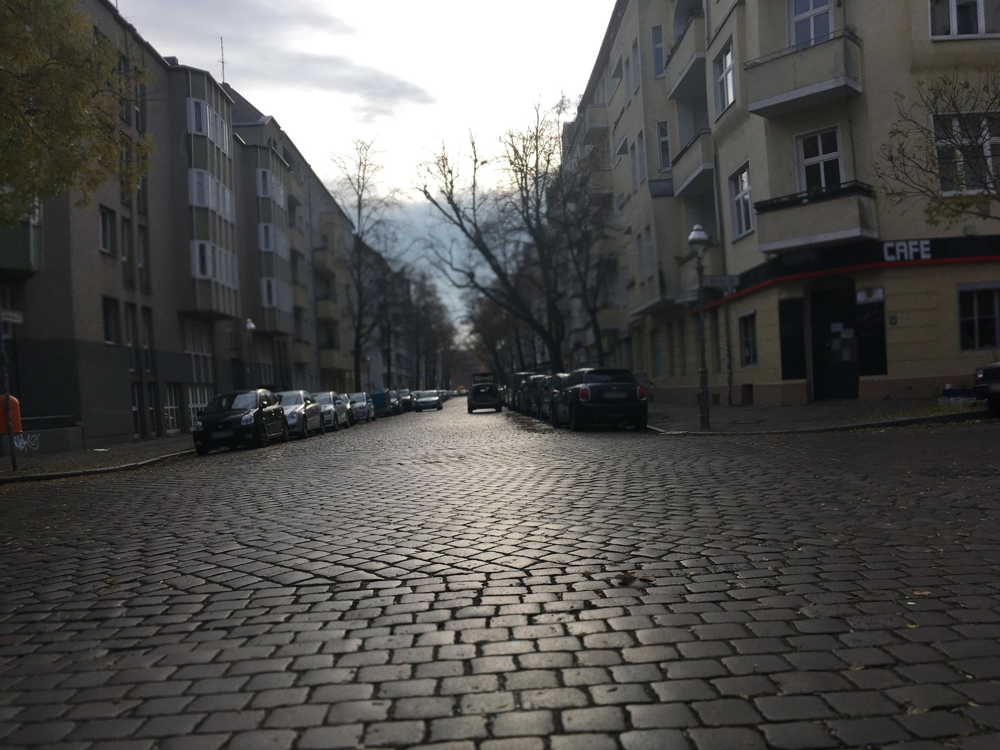

In [ ]:
# @title Check search results {run:'auto'}

slider_value = 0  # @param {type: "slider", min: 0, max: 3}

Image.open(search_results['cobblestone'][slider_value][0])


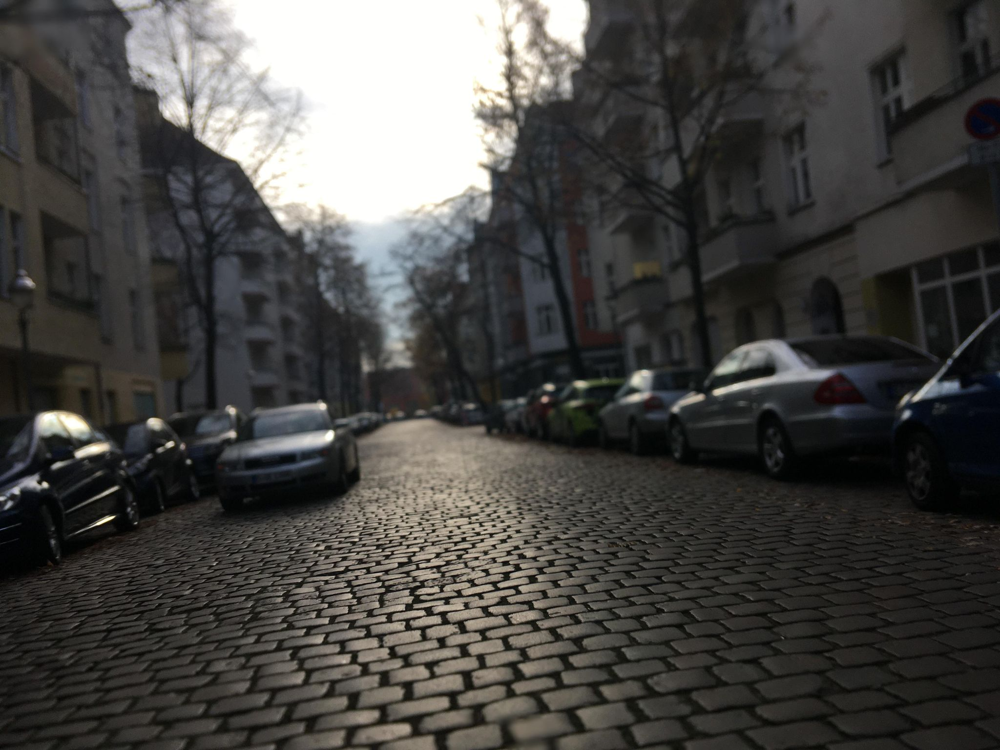

In [ ]:
# @title Check search results {run:'auto'}

slider_value = 3  # @param {type: "slider", min: 0, max: 3}

Image.open(search_results['asphalt'][slider_value][0])

In [ ]:
# Print results
for query, matches in search_results.items():
    print(f"\nTop matches for '{query}':")
    for path, score in matches:
        print(f"  {path}: {score:.3f}")